## Inside of CNN layers

In [1]:
### Here, my goal is trying to check for
### what every layer like Conv, maxpooling and other different layers, present inside the CNN sees individually

### loading the libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import tensorflow
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array, array_to_img
from tensorflow.keras.layers import Input

### loading sample image and the model

In [3]:
target_size = (224, 224)
test_image = load_img('../data/raw/test/dogs/dog_28.jpg', target_size = target_size)
test_image = img_to_array(test_image) / 255.0

In [6]:
test_image_2 = load_img('../data/raw/test/dogs/dog_44.jpg', target_size = target_size)
test_image_2 = img_to_array(test_image) / 255.0

In [17]:
type(test_image)

numpy.ndarray

In [25]:
test_images = np.stack([test_image, test_image_2], axis = 0)

In [26]:
print(f"{test_image.shape} :: {test_image_2.shape} :: {test_images.shape}")

(224, 224, 3) :: (224, 224, 3) :: (2, 224, 224, 3)


In [7]:
model = load_model('../models/binary_class_model.h5')
model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [8]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18432)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     2,359,424 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,730,369 (10.42 MB)

 Trainable params: 2,730,369 (10.42 MB)

 Non-trainable params: 0 (0.00 B)

### getting the outputs of the layers and visualising them

In [9]:
for i, layer in enumerate(model.layers) : 
    print(i, layer.name, type(layer))

0 conv2d <class 'keras.src.layers.convolutional.conv2d.Conv2D'>
1 max_pooling2d <class 'keras.src.layers.pooling.max_pooling2d.MaxPooling2D'>
2 conv2d_1 <class 'keras.src.layers.convolutional.conv2d.Conv2D'>
3 max_pooling2d_1 <class 'keras.src.layers.pooling.max_pooling2d.MaxPooling2D'>
4 conv2d_2 <class 'keras.src.layers.convolutional.conv2d.Conv2D'>
5 max_pooling2d_2 <class 'keras.src.layers.pooling.max_pooling2d.MaxPooling2D'>
6 conv2d_3 <class 'keras.src.layers.convolutional.conv2d.Conv2D'>
7 max_pooling2d_3 <class 'keras.src.layers.pooling.max_pooling2d.MaxPooling2D'>
8 flatten <class 'keras.src.layers.reshaping.flatten.Flatten'>
9 dense <class 'keras.src.layers.core.dense.Dense'>
10 dense_1 <class 'keras.src.layers.core.dense.Dense'>


In [10]:
dummy = np.zeros((224, 224, 3))
dummy.shape

(224, 224, 3)

In [11]:
model.inputs

[<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=False, ragged=False, name=input_layer>]

In [12]:
_ = model.predict(np.zeros((1, 224, 224, 3)))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


### -------------for the first image----------------

### for the first conv2d layer

In [13]:
inference_model = Model(inputs = model.inputs, outputs = model.get_layer('conv2d').output)

In [27]:
feature_maps = inference_model.predict(test_images)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


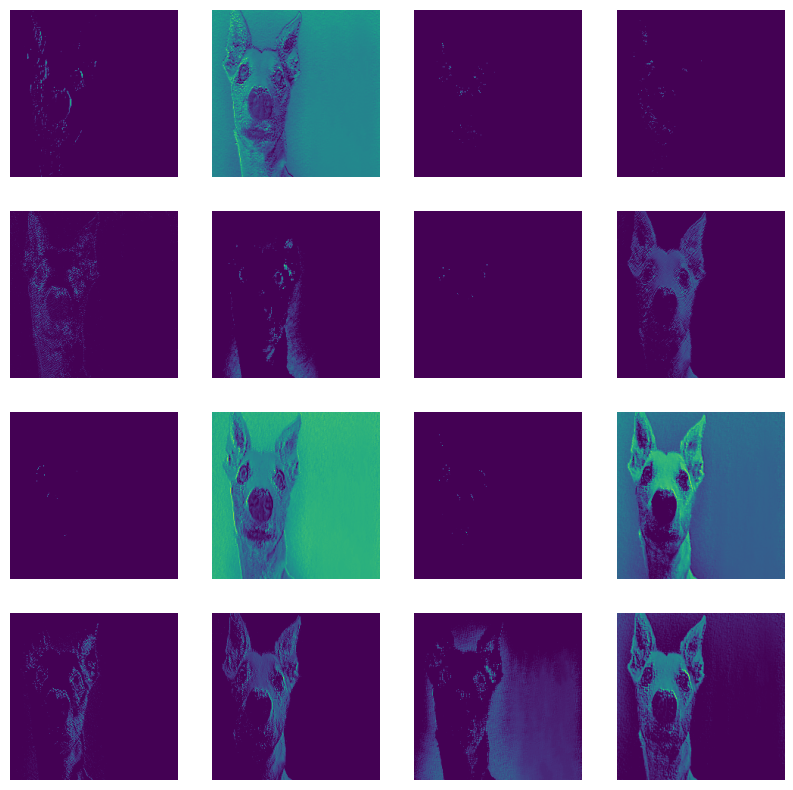

In [30]:
num_filters = feature_maps.shape[-1]
plt.figure(figsize=(10, 10))
for i in range(min(num_filters, 16)): # Displaying up to 16 filters
    plt.subplot(4, 4, i + 1)
    plt.imshow(feature_maps[0, :, :, i], cmap='viridis') # Using 'viridis' for better contrast
    plt.axis('off')
plt.show()

### for the maxpooling2d layer

In [33]:
inference_model = Model(inputs = model.inputs, outputs = model.get_layer('max_pooling2d').output)

In [34]:
feature_maps = inference_model.predict(test_images)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


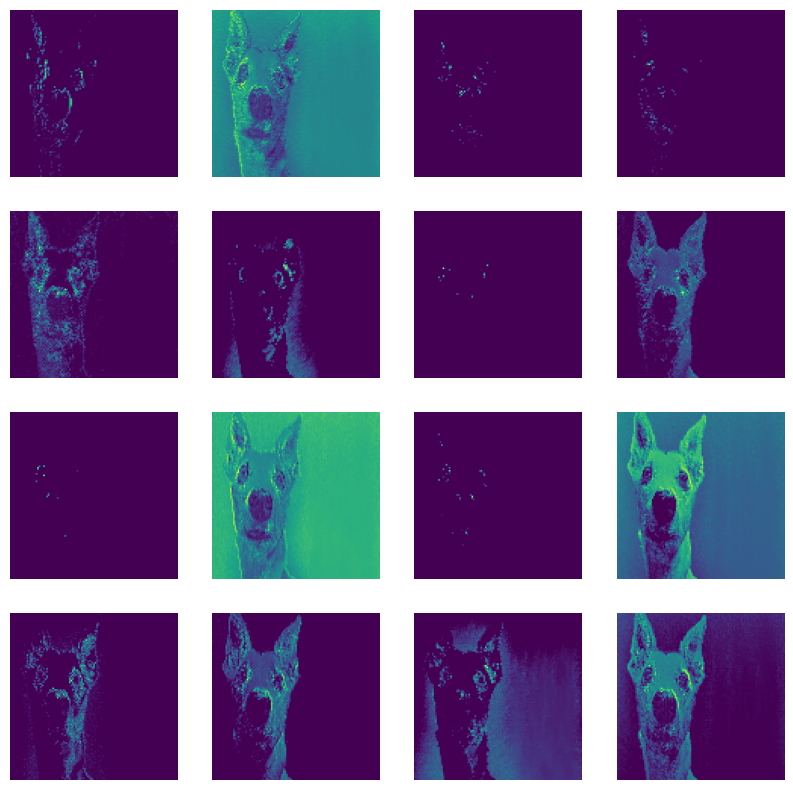

In [36]:
num_fatures = feature_maps.shape[-1]
plt.figure(figsize = (10, 10))
for i in range(min(num_filters, 16)) : 
    plt.subplot(4, 4, i + 1)
    plt.imshow(feature_maps[0, :, :, i], cmap = 'viridis')
    plt.axis('off')
plt.show()

### ---------------for the second image----------------

In [37]:
inference_model = Model(inputs = model.inputs, outputs = model.get_layer('conv2d').output)

In [38]:
feature_maps = inference_model.predict(test_images)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


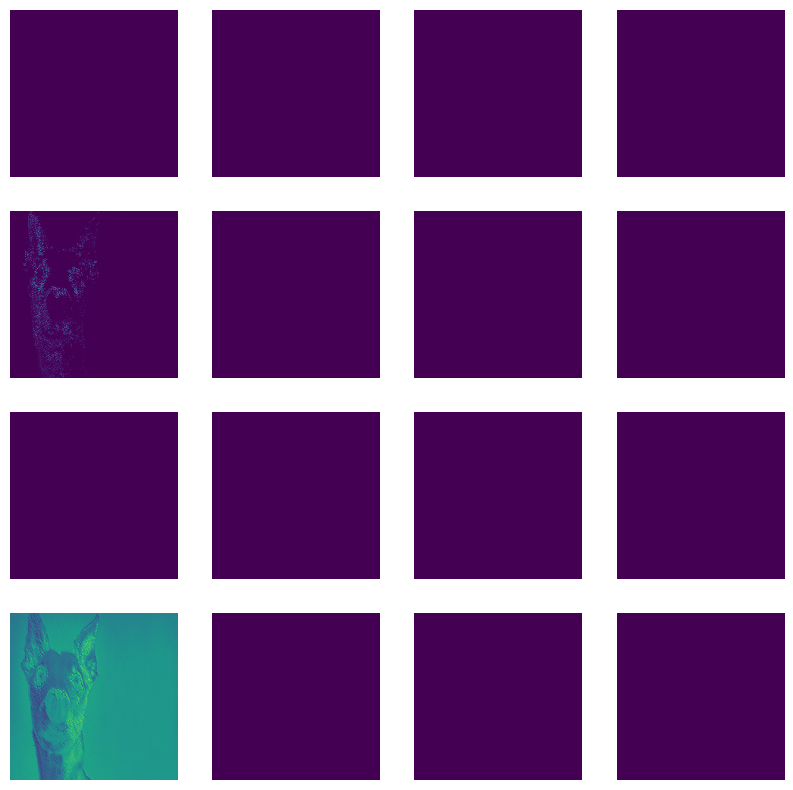

In [39]:
num_filters = feature_maps.shape[-1]
plt.figure(figsize = (10, 10))
for i in range(min(num_filters, 16)) : 
    plt.subplot(4, 4, i + 1)
    plt.imshow(feature_maps[1, :, :, i ], cmap = 'viridis')
    plt.axis('off')
plt.show()

### --------------increasing the number of filters--------------

In [44]:
### basically here I am just trying and see all the 64 filters that were present in our first conv2d layer
### for both the images

In [43]:
plt.figure(figsize = (100, 100))
for i in range(max(num_filters, 16)) : 
    plt.subplot(8, 8, i + 1)
    plt.imshow(feature_maps[0, :, :, i], cmap = 'viridis')
    plt.axis('off')
plt.show()

In [45]:
plt.figure(figsize = (100, 100))
for i in range(max(num_filters, 16)) : 
    plt.subplot(8, 8, i + 1)
    plt.imshow(feature_maps[1, :, :, i], cmap = 'viridis')
    plt.axis('off')
plt.show()

### ----------checking for the next conv2d layer---------------

In [46]:
### well this one had the 128 filters

In [47]:
inference_model = Model(inputs = model.inputs, outputs = model.get_layer('conv2d_1').output)

In [48]:
feature_maps = inference_model.predict(test_images)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


In [49]:
print(f"{feature_maps.shape} :: {feature_maps.shape[-1]}")

(2, 109, 109, 128) :: 128


In [50]:
num_filters = feature_maps.shape[-1]
plt.figure(figsize = (100, 100))
for i in range(min(num_filters, 121)) :
    plt.subplot(11, 11, i + 1)
    plt.imshow(feature_maps[0, :, :, i], cmap = 'viridis')
    plt.axis('off')
plt.show()

### for the second image

In [53]:
num_filters = feature_maps.shape[-1]
plt.figure(figsize = (100, 100))
for i in range(min(num_filters, 121)) :
    plt.subplot(11, 11, i + 1)
    plt.imshow(feature_maps[1, :, :, i], cmap = 'viridis')
    plt.axis('off')
plt.show()